<div style="width: 95%; height: 100px; background: #fefcf7;
border: 3px solid #e0c97f; text-align: center; line-height: 100px; color: #225e60; font-size: 24px; font-weight: bold; border-radius: 6px;">
🤟Isolated Persian Sign Language Recognition🤟
</div>

<div style="width: 95%; background: #fefcf7; color: #333333; padding: 20px; border: 3px solid #e0c97f; margin-bottom: 20px; border-radius: 10px;">
    <h3 style="color: #225e60;font-weight: bold">Introduction</h3>
    <span>
        This is a starter notebook for my dataset on Persian Sign Language. In this version of the notebook, no special preprocessing is done on the data, only simple normalization on every feature, and then training two models: one that leverages 1DConv layers, and another that uses 2DConv layers instead. In the following version, however, the aim is to apply signal processing techniques during the preprocessing phase, hopefully improving performance and reducing training time.
    </span>
    <h3 style="color: #225e60;font-weight: bold">Dataset</h3>
    <span>
        <a href="https://www.kaggle.com/datasets/sohaibmoradi/psl-tabular/data" style="color: #225e60"> Isolated Persian Sign Language Dataset</a>
    </span>
    <br/>
    <h3 style="color: #225e60;font-weight: bold">Tasks in this notebook</h3>
    <ul style="list-style-type: none; padding-left: 0;">
        <li><span style="color:#4fb0a0, margin-left: -10px;">&#8226;</span> Dataset Loading And Visualiztion</li>
        <li><span style="color:#4fb0a0, margin-left: -10px;">&#8226;</span> Model Training</li>
    </ul>
</div>


<center><div style="width: 100%; height: 70px; text-align: center; line-height: 70px; color: #648045; font-size: 24px;">
📚Importing Necessary Libraries📚
</div></center>

In [1]:
# Installing necessary packages
!pip install rarfile fastparquet --quiet

# Loading necessary libraries and frameworks
from torch.utils.data import DataLoader, Dataset
from matplotlib.animation import FuncAnimation
from sklearn.metrics import accuracy_score
from scipy.linalg import block_diag
from tqdm.autonotebook import tqdm as tqdm2
from IPython.display import HTML
import torch.nn.functional as F
import matplotlib.pyplot as plt
from google.colab import drive
import torch.optim as optim
from copy import deepcopy
import torch.nn as nn
import pandas as pd
import numpy as np
import warnings
import rarfile
import random
import torch
import time
import json
import glob
import tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 25.0 MB/s eta 0:00:00


/tmp/ipykernel_20/2293585286.py:9: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm as tqdm2


In [2]:
from warnings import simplefilter
simplefilter(action="ignore", category=pd.errors.PerformanceWarning)

In [3]:
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

MAX_VIDEO_LENGTH = 160 # maximum numebr of frames \ max context length

face_color = plt.cm.get_cmap("winter")
pose_color = plt.cm.get_cmap("spring")
rh_color = plt.cm.get_cmap("summer")
lh_color = plt.cm.get_cmap("autumn")

/tmp/ipykernel_20/2734045914.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  face_color = plt.cm.get_cmap("winter")
/tmp/ipykernel_20/2734045914.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  pose_color = plt.cm.get_cmap("spring")
/tmp/ipykernel_20/2734045914.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  rh_color = plt.cm.get_cmap("summer")
/tmp/ipykernel_20/2734045914.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 a

<div style="width: 100%; height: 70px; text-align: center; line-height: 70px; color: #648045; font-size: 24px;">
Loading the Dataset
</div>

In [4]:
files = list(glob.glob("/kaggle/input/psl-tabular/PSL_tabular/PSL tabular/*"))
COLS_TO_DROP = ["frame_NO", "video_NO", "label"]
random.shuffle(files)

In [5]:
# data_info1 = json.load(open( "/kaggle/input/psl-tabular/data_info.json" ))

# data_info is meant to help with splitting the entire dataset
# into train, test- and validation subsets.
data_info = {}

for i, f in enumerate(tqdm.tqdm(files)):
    file_name = f.split("/")[-1].split(".")[0].split("-")[0]
    if file_name in data_info.keys():
        file_name += "1"

    df = pd.read_parquet(f, engine="pyarrow")

    data_info[file_name] = {
      "videos": list(df["video_NO"].unique()),
      "train": [],
      "val": [],
      "test": [],
      "id": i}

data_info["چهارشنبه سوری"] = data_info.pop("چهارشنبه سوری ")

val_ratio = .2
test_ratio = .1

for key in tqdm.tqdm(data_info.keys()):

  l = data_info[key]["videos"]
  random.shuffle(l)

  test_num = max(1, int(test_ratio*len(l)))
  val_num = max(2, int(val_ratio*len(l)))

  data_info[key]["test"] = l[:test_num]
  data_info[key]["val"] = l[test_num:test_num+val_num]
  data_info[key]["train"] = l[test_num+val_num:]

100%|██████████| 280/280 [00:00<00:00, 100963.30it/s]


<div style="width: 100%; height: 70px; text-align: center; line-height: 70px; color: #648045; font-size: 24px;">
🤝Helper Function🤝
</div>

In [6]:
# The following functions are meant to be used for visulaiztion. The get_hand(...)
# function finds the hand landmarks and creates sequences of them, representing
# sequential connectivity.

def get_hand(frame, hand):

  assert type(hand) == str, "hand variable should be of type string"
  assert hand.lower() == "right" or hand.lower() == "left", "right hand or left hand "

  hand_cols = [col for col in frame.columns if f"{hand}_hand" in col]
  hand_points = np.array(frame[hand_cols]).reshape(-1, 3)

  hand_points = [
      np.array(frame[[col for k in range(1, 6) for col in frame.columns if f"{hand}_hand_{k}_" in col]]).reshape(-1, 3),
      np.array(frame[[col for k in range(6, 10) for col in frame.columns if f"{hand}_hand_{k}_" in col]]).reshape(-1, 3),
      np.array(frame[[col for k in range(10, 14) for col in frame.columns if f"{hand}_hand_{k}_" in col]]).reshape(-1, 3),
      np.array(frame[[col for k in range(14, 18) for col in frame.columns if f"{hand}_hand_{k}_" in col]]).reshape(-1, 3),
      np.array(frame[[col for k in range(18, 22) for col in frame.columns if f"{hand}_hand_{k}_" in col]]).reshape(-1, 3),
      np.array(frame[[col for k in [1, 6, 10, 14, 18, 1] for col in frame.columns if f"{hand}_hand_{k}_" in col]]).reshape(-1, 3),
  ]

  # Normalizing z values
  for i in range(len(hand_points)):
    hand_points[i][:, 2] = (hand_points[i][:, 2] - min(hand_points[i][:, 2])) / (max(hand_points[i][:, 2]) - min(hand_points[i][:, 2]))

  return hand_points


# The get_pose(...) function is similir to the get_hand(...) function.
# It finds pose landmarks and creates sequential connectivity.

def get_pose(frame):

  pose_points = [
      np.array(frame[[col for k in [9, 7, 6, 5, 1, 2, 3, 4, 8] for col in frame.columns if f"pose_{k}_" in col]]).reshape(-1, 3),
      np.array(frame[[col for k in [11, 10] for col in frame.columns if f"pose_{k}_" in col]]).reshape(-1, 3),
      np.array(frame[[col for k in [23, 17, 21, 19, 17, 15, 13, 12, 14, 16, 18, 20, 16, 22] for col in frame.columns if f"pose_{k}_" in col]]).reshape(-1, 3),
      np.array(frame[[col for k in [13, 25] for col in frame.columns if f"pose_{k}_" in col]]).reshape(-1, 3),
      np.array(frame[[col for k in [12, 24] for col in frame.columns if f"pose_{k}_" in col]]).reshape(-1, 3),
      np.array(frame[[col for k in [25, 24] for col in frame.columns if f"pose_{k}_" in col]]).reshape(-1, 3),
  ]

  # Normalizing z values
  for i in range(len(pose_points)):
    pose_points[i][:, 2] = (pose_points[i][:, 2] - min(pose_points[i][:, 2])) / (max(pose_points[i][:, 2]) - min(pose_points[i][:, 2]))

  return pose_points

# This function only return the face landmarks. No, connections required as the
# landmarks will be plotted as floating points in space.

def get_face(frame):
  face_cols = [col for col in frame.columns if "face" in col]
  face_points = np.array(frame[face_cols]).reshape(-1, 3)

  # Normalizing z values
  zmin = face_points[:, 2].min()
  zmax = face_points[:, 2].max()

  face_points[:, 2] = (face_points[:, 2] - zmin) / (zmax - zmin)

  return face_points

In [7]:
# There are 468 face landmarks, but we don't need all of thim for this task, at least for now.
# Therefore, we drop most of them and keep the landmarks for nose, eyes, eyebrows, mouth, and
# the face edge.

nose_landmarks = [1, 4, 5, 45, 46, 122, 168, 193, 196,
                198, 218, 219, 236, 237, 248, 249, 275,
                276, 278, 279, 289, 351, 360, 397, 417,
                419, 420, 438, 439, 456, 457, 468]

l_eye_eyebrow_landmarks = [33, 7, 163, 144, 145, 153,
                            154, 155, 157, 158, 159, 160,
                            161, 246, 46, 52, 53, 55, 65,
                            105, 107, 469, 470, 471, 472]
r_eye_eyebrow_landmarks = [263, 249, 390, 373, 374, 380, 381,
                            382, 384, 385, 386, 387, 388, 466,
                            276, 282, 283, 285, 295, 334, 336,
                            474, 475, 476, 477]

mouth_landmarks = [10, 33, 61, 78, 81, 87, 95, 146,
                  178, 181, 185, 191, 270, 267, 308,
                  311, 314, 317, 324, 375, 402, 405,
                  409, 415, 0, 11, 12, 13, 14, 15, 16,
                  17, 37, 39, 40, 62, 84, 88, 91, 93,
                  186, 269, 292, 306, 303, 310, 318,
                  320, 323, 403, 407, 416]

face_edge_landmarks = [30, 33, 37, 50, 58, 60, 63, 66, 69,
                      71, 90, 93, 102, 105, 106, 109, 117, 119,
                      127, 132, 133, 136, 137, 138, 139, 142, 147,
                      148, 149, 150, 151, 152, 162, 163, 172, 176,
                      178, 187, 200, 215, 216, 227, 234, 251, 263,
                      280, 284, 288, 290, 296, 297, 319, 323, 326,
                      329, 332, 338, 341, 351, 355, 356, 361, 365,
                      370, 377, 378, 379, 381, 383, 389, 397, 400,
                      411, 447, 454, 464]

In [8]:
len(data_info)

280

In [9]:
def remove_unwanted_features(df):

    face_cols = [col for col in df.columns if "face" in col]
    pose_cols = [col for col in df.columns if "pose" in col and "visibility" not in col]

    unwanted_pose_landmarks = [26, 27, 28, 29, 30, 31, 32, 33]
    unwanted_pose_cols = []

    for col in pose_cols:
        if int(col.split("_")[1]) in unwanted_pose_landmarks:
            unwanted_pose_cols.append(col)

    for col in unwanted_pose_cols:
        if col in pose_cols:
             pose_cols.remove(col)


    required_face_landmarks = set([*nose_landmarks, *l_eye_eyebrow_landmarks,
                                *r_eye_eyebrow_landmarks, *mouth_landmarks,
                                *face_edge_landmarks])

    required_face_cols = []

    for col in face_cols:
        if int(col.split("_")[1]) in required_face_landmarks:
            required_face_cols.append(col)


    required_cols = ["video_NO", "frame_NO",*required_face_cols, *pose_cols, "label"]
    # Hand columns are implicitly included since they are not in the drop list
    df = df.drop(columns=[col for col in df.columns if col not in required_cols and "hand" not in col])

    return df, required_cols, required_face_cols, pose_cols

In [10]:
# The following function is for animating sequences of landmarks, illustrating
# how a word or a phrase is signed. It is like putting bunch of frames together
# and creating a video out of them.

def animate2D(frame_num ,sequence, ax):

  lh_landmarks = get_hand(sequence.iloc[[frame_num]], "left")
  rh_landmarks = get_hand(sequence.iloc[[frame_num]], "right")
  pose_landmarks = get_pose(sequence.iloc[[frame_num]])
  face_landmarks = get_face(sequence.iloc[[frame_num]])


  # Normalizing z values
  for i in range(len(lh_landmarks)):
    lh_landmarks[i][:, 2] = (lh_landmarks[i][:, 2] - min(lh_landmarks[i][:, 2])) / (max(lh_landmarks[i][:, 2]) - min(lh_landmarks[i][:, 2]))
    rh_landmarks[i][:, 2] = (rh_landmarks[i][:, 2] - min(rh_landmarks[i][:, 2])) / (max(rh_landmarks[i][:, 2]) - min(rh_landmarks[i][:, 2]))

  for i in range(len(pose_landmarks)):
    pose_landmarks[i][:, 2] = (pose_landmarks[i][:, 2] - min(pose_landmarks[i][:, 2])) / (max(pose_landmarks[i][:, 2]) - min(pose_landmarks[i][:, 2]))

  zmin = face_landmarks[:, 2].min()
  zmax = face_landmarks[:, 2].max()

  face_landmarks[:, 2] = (face_landmarks[:, 2] - zmin) / (zmax - zmin)

  ax.clear()
  ax.set_xlim(.2, .8)
  ax.set_ylim(-1.2, 0)
  ax.axis(False)


  for i in range(len(rh_landmarks)):

    alpha = rh_landmarks[i][:, 2].mean()
    alpha = 1. if np.isnan(alpha) else min(1, max(0, alpha))
    ax.plot(rh_landmarks[i][:, 0], -rh_landmarks[i][:, 1], color=rh_color(.5), alpha=alpha)

    alpha = lh_landmarks[i][:, 2].mean()
    alpha = 1. if np.isnan(alpha) else min(1, max(0, alpha))
    ax.plot(lh_landmarks[i][:, 0], -lh_landmarks[i][:, 1], color=lh_color(.5), alpha=alpha)

    alpha = pose_landmarks[i][:, 2].mean()
    alpha = 1. if np.isnan(alpha) else min(1, max(0, alpha))
    ax.plot(pose_landmarks[i][:, 0], -pose_landmarks[i][:, 1], color=pose_color(.5), alpha=alpha)

  alpha = face_landmarks[:, 2].mean()
  alpha = 1. if np.isnan(alpha) else min(1, max(0, alpha))
  ax.plot(face_landmarks[:, 0], -face_landmarks[:, 1], ".", color=face_color(.5), alpha=alpha)

  plt.close()


def visualize2D(sequence):
  fig, ax = plt.subplots()
  l, = ax.plot([], [])
  animation = FuncAnimation(fig, func=lambda x: animate2D(int(x-1), sequence, ax),
                            frames=sequence["frame_NO"].unique())

  # Displaying animation as HTML5 video
  return HTML(animation.to_html5_video())

<div style="width: 100%; height: 70px; text-align: center; line-height: 70px; color: #648045; font-size: 24px;">
🎨 Visualization 🎨
</div>

In [11]:
# picking a sign to visulize
ind = 119
file_name = files[ind].split("/")[-1].split(".")[0]
# Read the Parquet file
df_sample = pd.read_parquet(files[ind], engine="fastparquet")

In [12]:
n = 300
df_sample_cut, required_cols, required_face_cols, pose_cols = remove_unwanted_features(df_sample.copy())
df_sample_cut = df_sample_cut.drop(columns=[col for col in df_sample_cut.columns if col not in required_cols and "hand" not in col])

# This visualization logic is using the output of the geometric normalization and is correct for the plot.
# The `get_hand`, `get_pose`, `get_face` functions perform Z-normalization *on the Z-coordinate only* for visualization.
# This is typically an acceptable visual aid but is separate from the feature engineering pipeline.
face_landmarks_cut = get_face(df_sample_cut[required_face_cols].iloc[[n]].copy())
full_face_landmarks = get_face(df_sample[[col for col in df_sample.columns if "face" in col]].iloc[[n]].copy())

rh_landmarks = get_hand(df_sample_cut.iloc[[n]].copy(), "right")
lh_landmarks = get_hand(df_sample_cut.iloc[[n]].copy(), "left")
pose_landmarks = get_pose(df_sample_cut[pose_cols].iloc[[n]].copy())

/tmp/ipykernel_20/2859951430.py:12: RuntimeWarning: Mean of empty slice
  alpha = np.nanmean(rh_landmarks[i][:, 2])
/tmp/ipykernel_20/2859951430.py:16: RuntimeWarning: Mean of empty slice
  alpha = np.nanmean(lh_landmarks[i][:, 2])


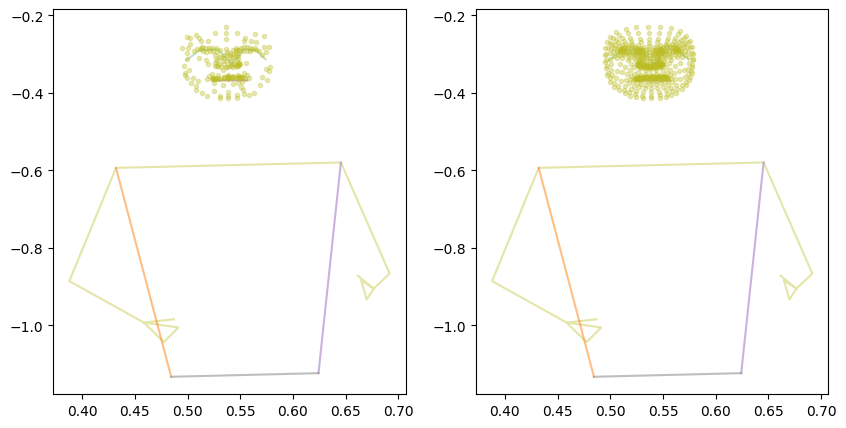

In [13]:
# The output of this cell is to not onlt showcase how the data instances look,
# but laso show the difference between when we keep all the features and when
# we decide to drop most facial landmarks.

plt.subplots(1, 2, figsize=(10, 5))

for j in range(1,3):
    plt.subplot(1, 2, j)

    for i in range(len(rh_landmarks)):

        alpha = np.nanmean(rh_landmarks[i][:, 2])
        alpha = 1. if np.isnan(alpha) else alpha
        plt.plot(rh_landmarks[i][:, 0], -rh_landmarks[i][:, 1], alpha=alpha)

        alpha = np.nanmean(lh_landmarks[i][:, 2])
        alpha = 1. if np.isnan(alpha) else alpha
        plt.plot(lh_landmarks[i][:, 0], -lh_landmarks[i][:, 1], alpha=alpha)

        alpha = np.nanmean(pose_landmarks[i][:, 2])
        alpha = 1. if np.isnan(alpha) else alpha
        plt.plot(pose_landmarks[i][:, 0], -pose_landmarks[i][:, 1], alpha=alpha)

plt.subplot(1, 2, 1)
plt.plot(face_landmarks_cut[:, 0], -face_landmarks_cut[:, 1], ".", alpha=np.nanmean(face_landmarks_cut[:, 2]))
plt.subplot(1, 2, 2)
plt.plot(full_face_landmarks[:, 0], -full_face_landmarks[:, 1], ".", alpha=np.nanmean(full_face_landmarks[:, 2]))

plt.show()

In [14]:
vid_num = df_sample_cut.iloc[[n]]["video_NO"].values[0]
a = df_sample_cut.query(f"video_NO == '{vid_num}'").drop(columns=["video_NO", "label"])

In [15]:
visualize2D(a)

<div style="width: 100%; height: 130px; text-align: center; line-height: 70px; color: #648045; font-size: 24px;">
Loading the Entire Dataset, Spliting into Train, Test, and Validation Subsets, and Visualizing the Data as Images and Signals
</div>

In [16]:
cols = df_sample_cut.drop(columns=COLS_TO_DROP).columns

b = df_sample_cut.copy()

std = df_sample_cut.groupby("video_NO")[cols].transform(lambda s: s.std(ddof=0)).replace(0, np.nan)
mean = df_sample_cut.groupby("video_NO")[cols].transform("mean")

b[cols] = (b[cols] - mean) / std

b['_row'] = b.groupby("video_NO").cumcount()
groups = b["video_NO"].unique()

full_index = pd.MultiIndex.from_product([groups, range(MAX_VIDEO_LENGTH)],
                                        names=["video_NO", '_row'])
b = b.set_index(["video_NO", '_row']).reindex(full_index).reset_index()


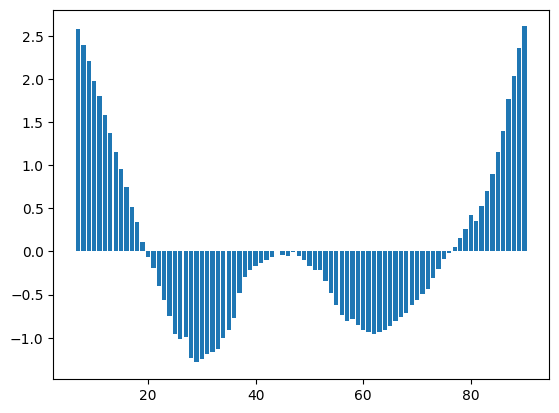

In [17]:
item = b.query(f"video_NO == '{vid_num}'")["right_hand_3_y"]
plt.bar(range(len(item)), item)
plt.show()

In [18]:
FINAL_COLUMNS = [col for col in df_sample_cut.drop(columns=['video_NO',
                                                            'frame_NO', 'label']).columns if any(c in col for c in ['x', 'y', 'z'])]

In [19]:
# Loading the entire dataset for faster model training later
# Note: Better ways exist for this. I just haven't learn them, yet.

def pre_load_and_normalize_data(files, data_info, final_columns, max_video_length, unwanted_features_fn):
    """
    Loads all videos for a given mode ('val' or 'test'), applies global normalization,
    and returns a list of pre-processed (x, y) tensors.
    """

    X_train = []
    y_train = []

    X_val = []
    y_val = []

    X_test = []
    y_test = []


    for file_path in tqdm.tqdm(files):

        df_sign = pd.read_parquet(file_path, engine="fastparquet", columns=final_columns + ["frame_NO", "video_NO", "label"])

        label = df_sign.iloc[0]["label"]

        if label == "چهارشنبه سوری ":
            label = "چهارشنبه سوری"

        if label in ["میهمانی", "رفتن، رفت", "سرخ", "گاو"]:
            label = file_path.split("/")[-1].split(".")[0].split("-")[0]

        c_train_vids = len(data_info[label]["train"])
        c_val_vids = len(data_info[label]["val"])
        c_test_vids = len(data_info[label]["test"])

        # Applying Z-transform (This is normalization and has nothing
        # to do with the Z_transform from Signal Processing)
        std = df_sign.groupby("video_NO")[final_columns].transform(lambda s: s.std(ddof=0)).replace(0, np.nan)
        mean = df_sign.groupby("video_NO")[final_columns].transform("mean")

        df_sign[final_columns] = (df_sign[final_columns] - mean) / std

        # Truncating to have every sequence to bo of length MAX_VIDEO_LENGTH
        temp = df_sign.copy()
        temp['_row'] = temp.groupby("video_NO").cumcount()
        groups = temp["video_NO"].unique()

        full_index = pd.MultiIndex.from_product([groups, range(MAX_VIDEO_LENGTH)],
                                                names=["video_NO", '_row'])
        df_sign = temp.set_index(["video_NO", '_row']).reindex(full_index).reset_index()
        del temp

        # df_sign[final_columns] = df_sign[final_columns].astype('float16')

        df_sign_train = df_sign[df_sign["video_NO"].isin(data_info[label]["train"])].copy()
        df_sign_val = df_sign[df_sign["video_NO"].isin(data_info[label]["val"])].copy()
        df_sign_test = df_sign[df_sign["video_NO"].isin(data_info[label]["test"])].copy()

        del df_sign

        df_sign_train = df_sign_train.drop(columns=COLS_TO_DROP+["_row"])
        df_sign_val = df_sign_val.drop(columns=COLS_TO_DROP+["_row"])
        df_sign_test = df_sign_test.drop(columns=COLS_TO_DROP+["_row"])

        x_cols = [col for col in final_columns if "x" in col]
        y_cols = [col for col in final_columns if "y" in col]
        z_cols = [col for col in final_columns if "z" in col]

        train_sign_vids_x = df_sign_train[x_cols].copy().to_numpy().reshape(-1, MAX_VIDEO_LENGTH, len(x_cols))
        train_sign_vids_y = df_sign_train[y_cols].copy().to_numpy().reshape(-1, MAX_VIDEO_LENGTH, len(y_cols))
        train_sign_vids_z = df_sign_train[z_cols].copy().to_numpy().reshape(-1, MAX_VIDEO_LENGTH, len(z_cols))

        val_sign_vids_x = df_sign_val[x_cols].copy().to_numpy().reshape(-1, MAX_VIDEO_LENGTH, len(x_cols))
        val_sign_vids_y = df_sign_val[y_cols].copy().to_numpy().reshape(-1, MAX_VIDEO_LENGTH, len(y_cols))
        val_sign_vids_z = df_sign_val[z_cols].copy().to_numpy().reshape(-1, MAX_VIDEO_LENGTH, len(z_cols))

        test_sign_vids_x = df_sign_test[x_cols].copy().to_numpy().reshape(-1, MAX_VIDEO_LENGTH, len(x_cols))
        test_sign_vids_y = df_sign_test[y_cols].copy().to_numpy().reshape(-1, MAX_VIDEO_LENGTH, len(y_cols))
        test_sign_vids_z = df_sign_test[z_cols].copy().to_numpy().reshape(-1, MAX_VIDEO_LENGTH, len(z_cols))

        del df_sign_train
        del df_sign_val
        del df_sign_test

        X_train.append(np.stack((train_sign_vids_x, train_sign_vids_y, train_sign_vids_z), axis=-1))
        X_val.append(np.stack((val_sign_vids_x, val_sign_vids_y, val_sign_vids_z), axis=-1))
        X_test.append(np.stack((test_sign_vids_x, test_sign_vids_y, test_sign_vids_z), axis=-1))

        y = np.zeros(len(data_info))
        y[data_info[label]["id"]] = 1


        for Y in [(y_train, c_train_vids), (y_val, c_val_vids), (y_test, c_test_vids)]:
          for _ in range(Y[1]):
            Y[0].append(y)
          

    X_train = np.concatenate(X_train, axis=0)
    X_val = np.concatenate(X_val, axis=0)
    X_test = np.concatenate(X_test, axis=0)

    # Converting to Tensors
    # We use float16 to reduce the amount of required memory
    X_train = torch.tensor(np.array(X_train), dtype=torch.float16)
    X_val = torch.tensor(np.array(X_val), dtype=torch.float16)
    X_test = torch.tensor(np.array(X_test), dtype=torch.float16)

    y_train = torch.tensor(np.array(y_train), dtype=torch.float16)
    y_val = torch.tensor(np.array(y_val), dtype=torch.float16)
    y_test = torch.tensor(np.array(y_test), dtype=torch.float16)

    print(f"Data pre-loading complete.")
    return (X_train, y_train), (X_val, y_val), (X_test, y_test)

TRAIN_SET, VAL_SET, TEST_SET = pre_load_and_normalize_data(files, data_info, FINAL_COLUMNS, MAX_VIDEO_LENGTH, remove_unwanted_features)

100%|██████████| 280/280 [02:25<00:00,  1.92it/s]


Data pre-loading complete.


In [20]:
def get_label_from_filepath(file_path):
    """
    Extracts the sign label from a file path based on the user's naming convention.
    Handles 'SignName.ext', 'SignName-extra.ext', and common extensions like .parquet, .gzip.
    """
    # Getting the filename (e.g., 'آب تنی-converted.gzip')
    file_name = file_path.split("/")[-1]

    # Getting the part before the first dot (e.g., 'آب تنی-converted')
    raw_label_part = file_name.split(".")[0]

    # Getting the part before the first hyphen (e.g., 'آب تنی')
    sign_label = raw_label_part.split("-")[0]
    return sign_label

train_video_references = []
warnings_list = []

for f in files:

    file_label = get_label_from_filepath(f)

    if file_label == "چهارشنبه سوری ":
        canonical_label = "چهارشنبه سوری"
    elif file_label in ["میهمانی", "رفتن", "سرخ", "گاو"]:
        # The file name itself is the corrected label key in data_info for these cases,
        canonical_label = file_label
    else:
        canonical_label = file_label


    if canonical_label in data_info:
        label_id = data_info[canonical_label]["id"]

        train_video_ids = data_info[canonical_label]["train"]

        for video_id in train_video_ids:
            train_video_references.append((f, video_id, label_id))
    else:
        warnings_list.append(f"Skipping file: {f}. Label '{file_label}' (-> '{canonical_label}') not found in data_info.")


print(f"\n--- Training Set Indexing ---")
print(f"Total training video samples indexed: {len(train_video_references)}")
if warnings_list:
    print("\nWarnings during indexing:")
    for w in warnings_list:
        print(f" - {w}")
print("-----------------------------\n")



--- Training Set Indexing ---
Total training video samples indexed: 5082
-----------------------------



In [21]:
class PSLDataset(Dataset):
    def __init__(self, mode="1D", pre_loaded_data=None, video_refs=None):

        self.max_video_length = MAX_VIDEO_LENGTH
        self.num_classes = len(data_info)
        self.X, self.y = pre_loaded_data
        self.mode = mode

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        
        if self.mode == "1D":
            x_sample = self.X[idx].reshape(self.max_video_length, -1)
            x_tensor = x_sample.T
        elif self.mode == "2D":
            x_sample = self.X[idx]
            x_tensor = x_sample.permute(2, 1, 0)
            
        y_tensor = self.y[idx]
    
        return x_tensor, y_tensor

In [22]:
dataset = PSLDataset(pre_loaded_data=TRAIN_SET)
X_sample, y_sample = dataset.__getitem__(0)

In [23]:
X_sample.shape, y_sample.shape

(torch.Size([759, 160]), torch.Size([280]))

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


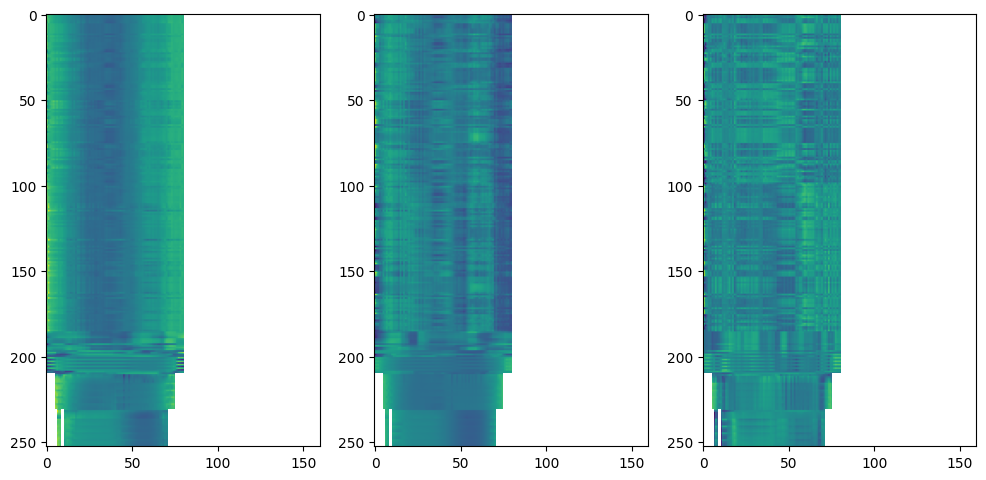

In [24]:
fig, axs = plt.subplots(1, 3, figsize=(12, 32))

axs[0].imshow(np.array(X_sample.T.reshape(160, -1, 3)[:, :, 0]).T)
axs[1].imshow(np.array(X_sample.T.reshape(160, -1, 3)[:, :, 1]).T)
axs[2].imshow(np.array(X_sample.T.reshape(160, -1, 3)[:, :, 2]).T)

plt.show()

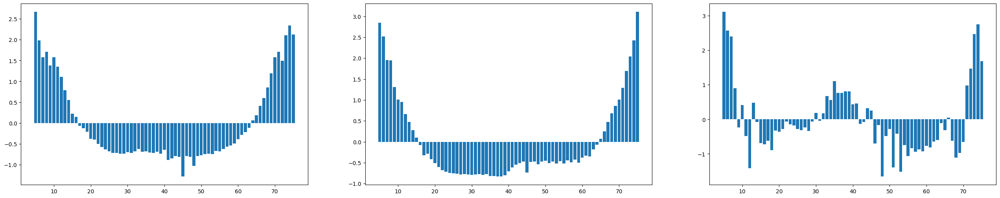

In [25]:
rows = 1
columns = 3
fig, axs = plt.subplots(rows, columns, figsize=(32, 6*rows))
for i in range(rows):
  for j in range(columns):
    axs[j].bar(range(160), X_sample.T.reshape(160, -1, 3)[:, 220, j])

plt.show()

In [26]:
train_dataset = PSLDataset(
    pre_loaded_data=TRAIN_SET
)

train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=32,
    shuffle=True,
    num_workers=2,
    persistent_workers=True,
    pin_memory=True,

)

# For 'val' and 'test' modes, pass the pre-loaded data tuple
val_dataset = PSLDataset(
    pre_loaded_data=VAL_SET
)
test_dataset = PSLDataset(
    pre_loaded_data=TEST_SET
)


val_loader = DataLoader(
    dataset=val_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    persistent_workers=True,
    pin_memory=True,
)

test_loader = DataLoader(
    dataset=test_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    persistent_workers=True,
    pin_memory=True,
)

print(f"Train DataLoader created with {len(train_dataset)} individual video samples.")
print(f"Validation DataLoader created with {len(val_dataset)} individual video samples.")
print(f"Test DataLoader created with {len(test_dataset)} individual video samples.")

Train DataLoader created with 5082 individual video samples.
Validation DataLoader created with 1273 individual video samples.
Test DataLoader created with 573 individual video samples.


<div style="width: 100%; height: 60px; text-align: center; line-height: 70px; color: #648045; font-size: 24px;">
Model Definition and Training
</div>

In [27]:
class SignLanguageModel(nn.Module):
    def __init__(self, input_channels, num_classes):
        super(SignLanguageModel, self).__init__()

        self.conv1 = nn.Conv1d(input_channels, 128, kernel_size=5, padding=2)
        self.bn1 = nn.BatchNorm1d(128, eps=1e-5, momentum=0.1)
        self.pool1 = nn.MaxPool1d(kernel_size=2)

        self.conv2 = nn.Conv1d(128, 256, kernel_size=5, padding=2)
        self.bn2 = nn.BatchNorm1d(256, eps=1e-5, momentum=0.1)
        self.pool2 = nn.MaxPool1d(kernel_size=2)
        self.dropout1 = nn.Dropout(0.5)

        self.conv3 = nn.Conv1d(256, 512, kernel_size=5, padding=2)
        self.bn3 = nn.BatchNorm1d(512, eps=1e-5, momentum=0.1)
        self.pool3 = nn.MaxPool1d(kernel_size=2)

        # Flattened size (160 frames -> divide by 2^3 after 3 maxpools)
        self.flattened_size = 512 * (MAX_VIDEO_LENGTH // (2**3))

        self.fc1 = nn.Linear(self.flattened_size, 512)
        self.dropout2 = nn.Dropout(0.5)
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        # Replace NaNs (from padding) with zeros
        x = torch.nan_to_num(x, nan=0.0)

        x = self.pool1(F.relu(self.bn1(self.conv1(x).float())).half())
        x = self.pool2(F.relu(self.bn2(self.conv2(x).float())).half())
        x = self.dropout2(x)
        x = self.pool3(F.relu(self.bn3(self.conv3(x).float())).half())

        x = x.reshape(x.size(0), -1)

        x = F.relu(self.fc1(x))
        x = self.dropout2(x)
        x = self.fc2(x)
        return x


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_channels = len(FINAL_COLUMNS)
num_classes = len(data_info)
model = SignLanguageModel(input_channels=input_channels, num_classes=num_classes).to(device)

In [28]:
# Device configuration
# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

scaler = torch.cuda.amp.GradScaler()

def train_epoch(model, train_loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    all_preds = []
    all_labels = []

    train_bar = tqdm2(train_loader, desc="Training", total=len(train_loader), leave=False)

    for inputs, labels in train_bar:
        inputs = inputs.to(device).half()  # cast to float16
        labels_indices = torch.argmax(labels, dim=1).to(device)

        optimizer.zero_grad()

        with torch.amp.autocast(str(device)):
            outputs = model(inputs)
            loss = criterion(outputs, labels_indices)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs.data, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels_indices.cpu().numpy())

        train_bar.set_postfix(batch_loss=f"{loss.item():.4f}")

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = accuracy_score(all_labels, all_preds)
    return epoch_loss, epoch_acc

def evaluate_model(model, data_loader, criterion, device):
    model.eval()
    running_loss = 0.0
    all_preds = []
    all_labels = []

    eval_bar = tqdm2(data_loader, desc="Evaluating", total=len(data_loader), leave=False)

    with torch.no_grad():
        for inputs, labels in eval_bar:
            inputs = inputs.to(device).half()  # float16 for inference
            labels_indices = torch.argmax(labels, dim=1).to(device)

            with torch.amp.autocast(str(device)):
                outputs = model(inputs)
                loss = criterion(outputs, labels_indices)

            running_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs.data, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels_indices.cpu().numpy())

            eval_bar.set_postfix(batch_loss=f"{loss.item():.4f}")

    epoch_loss = running_loss / len(data_loader.dataset)
    epoch_acc = accuracy_score(all_labels, all_preds)
    return epoch_loss, epoch_acc


num_epochs = 200 
best_val_acc = 0.0

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

print(f"Model initialized with {input_channels} input channels and {num_classes} output classes.")
print(f"Using device: {device}")
print("\nStarting training...")

epochs_bar = tqdm2(range(num_epochs), desc="Epochs")

for epoch in epochs_bar:
    start_time = time.time()

    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)
    val_loss, val_acc = evaluate_model(model, val_loader, criterion, device)

    end_time = time.time()
    epoch_duration = end_time - start_time

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accuracies.append(train_acc)
    val_accuracies.append(val_acc)

    epochs_bar.set_postfix(
        train_loss=f"{train_loss:.4f}",
        train_acc=f"{train_acc:.4f}",
        val_loss=f"{val_loss:.4f}",
        val_acc=f"{val_acc:.4f}",
    )

    # Save the model if validation accuracy improves
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), 'best_sign_language_model_1dcnn.pth')

print(f"  Model saved! Best validation accuracy: {best_val_acc:.4f}")

print("\nTraining complete!")


# Optional: Evaluate on the test set after training
# Load the best model weights before final evaluation
try:
    model.load_state_dict(torch.load('best_sign_language_model_1dcnn.pth'))
    model.to(device) # Ensure the loaded model is on the correct device
    test_loss, test_acc = evaluate_model(model, test_loader, criterion, device)
    print(f"\n--- Final Test Results (Best Model) ---")
    print(f"Test Loss: {test_loss:.4f}, Test Acc: {test_acc:.4f}")
    print("---------------------------------------")
except FileNotFoundError:
    print("Best model weights not found. Skipping final test evaluation.")

Model initialized with 759 input channels and 280 output classes.
Using device: cuda

Starting training...


/tmp/ipykernel_20/2289345061.py:6: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

  Model saved! Best validation accuracy: 0.8115

Training complete!


Evaluating:   0%|          | 0/18 [00:00<?, ?it/s]


--- Final Test Results (Best Model) ---
Test Loss: 1.0510, Test Acc: 0.7888
---------------------------------------


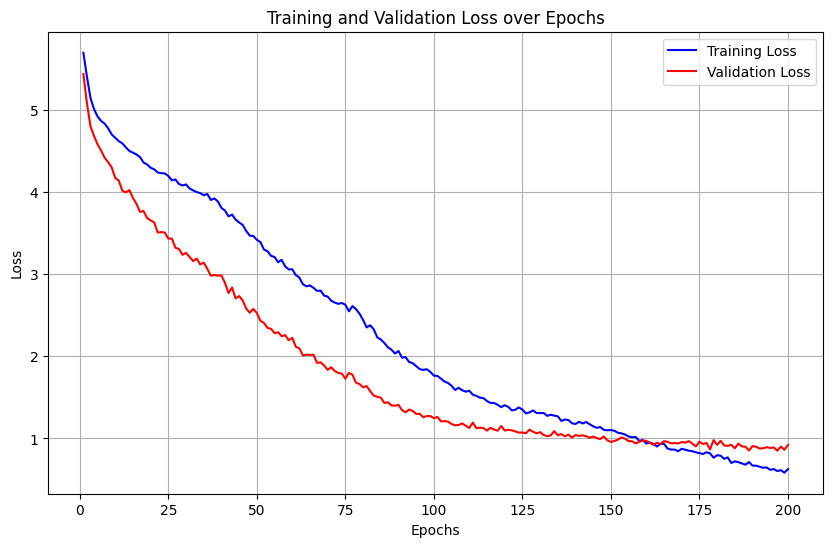

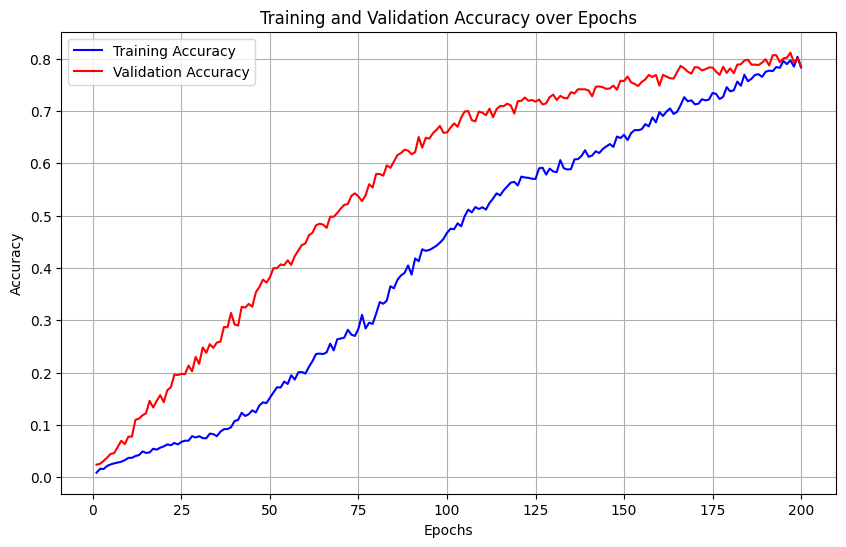

In [29]:
def plot_metrics(train_metrics, val_metrics, metric_name):
    epochs = range(1, len(train_metrics) + 1)
    
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_metrics, 'b', label=f'Training {metric_name}')
    plt.plot(epochs, val_metrics, 'r', label=f'Validation {metric_name}')
    plt.title(f'Training and Validation {metric_name} over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel(metric_name)
    plt.legend()
    plt.grid(True)
    plt.show()

plot_metrics(train_losses, val_losses, 'Loss')
plot_metrics(train_accuracies, val_accuracies, 'Accuracy')

In [30]:
train_dataset_2D = PSLDataset(
    pre_loaded_data=TRAIN_SET,
    mode="2D"
)

train_loader_2D = DataLoader(
    dataset=train_dataset_2D,
    batch_size=32,
    shuffle=True,
    num_workers=2,
    persistent_workers=True,
    pin_memory=True,
)

val_dataset_2D = PSLDataset(
    pre_loaded_data=VAL_SET,
        mode="2D"
)
test_dataset_2D = PSLDataset(
    pre_loaded_data=TEST_SET,
        mode="2D"
)


val_loader_2D = DataLoader(
    dataset=val_dataset_2D,
    batch_size=32,
    shuffle=False,
    num_workers=2,
    persistent_workers=True,
    pin_memory=True,
)

test_loader_2D = DataLoader(
    dataset=test_dataset_2D,
    batch_size=32,
    shuffle=False, 
    num_workers=2,
    persistent_workers=True,
    pin_memory=True,
)

print(f"Train DataLoader created with {len(train_dataset)} individual video samples.")
print(f"Validation DataLoader created with {len(val_dataset)} individual video samples.")
print(f"Test DataLoader created with {len(test_dataset)} individual video samples.")

Train DataLoader created with 5082 individual video samples.
Validation DataLoader created with 1273 individual video samples.
Test DataLoader created with 573 individual video samples.


In [31]:
class SignLanguageModelWith2DConv(nn.Module):
    def __init__(self, num_classes):
        super().__init__()

        self.conv1 = nn.Conv2d(3, 64, kernel_size=(3, 5), padding="same")
        self.bn1 = nn.BatchNorm2d(64)
        self.pool1 = nn.MaxPool2d((2, 1), stride=(2, 1))

        self.conv2 = nn.Conv2d(64, 128, kernel_size=(3, 5), padding="same")
        self.bn2 = nn.BatchNorm2d(128)
        self.pool2 = nn.MaxPool2d((2, 1), stride=(2, 1))
        self.dropout1 = nn.Dropout(0.5)
        
        self.conv3 = nn.Conv2d(128, 256, kernel_size=(3, 5), padding="same")
        self.bn3 = nn.BatchNorm2d(256)
        self.pool3 = nn.MaxPool2d((2, 2), stride=(2, 2))
        

        self.adaptive_pool = nn.AdaptiveAvgPool2d((4, 8))

        self.fc1 = nn.Linear(256*4*8, 1024)
        self.dropout2 = nn.Dropout(0.5)
        self.fc2 = nn.Linear(1024, num_classes)

    def forward(self, x):
        """
        x: (B, 3, 160, 253)
        """
        x = torch.nan_to_num(x, nan=0.0)
    
        x = self.pool1(F.relu(self.bn1(self.conv1(x))))
        x = self.pool2(F.relu(self.bn2(self.conv2(x))))
        x = self.dropout1(x)
        x = self.pool3(F.relu(self.bn3(self.conv3(x))))
    
        x = self.adaptive_pool(x)  # (B, 256, 1, 1)
        x = x.flatten(1)           # (B, 256)
    
        x = F.relu(self.fc1(x))
        x = self.dropout2(x)
        x = self.fc2(x)
    
        return x


num_classes = len(data_info)
model_2DConv = SignLanguageModelWith2DConv(num_classes=num_classes).to(device)

In [32]:
# Device configuration
# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_2DConv.parameters(), lr=0.001)

scaler = torch.cuda.amp.GradScaler()

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

num_epochs = 200
best_val_acc = 0.0

print(f"Model initialized with {num_classes} output classes.")
print(f"Using device: {device}")
print("\nStarting training...")

epochs_bar = tqdm2(range(num_epochs), desc="Epochs")

for epoch in epochs_bar:
    start_time = time.time()

    train_loss, train_acc = train_epoch(model_2DConv, train_loader_2D, criterion, optimizer, device)
    val_loss, val_acc = evaluate_model(model_2DConv, val_loader_2D, criterion, device)

    end_time = time.time()
    epoch_duration = end_time - start_time


    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accuracies.append(train_acc)
    val_accuracies.append(val_acc)

    # Update the epoch bar with the results
    epochs_bar.set_postfix(
        train_loss=f"{train_loss:.4f}",
        train_acc=f"{train_acc:.4f}",
        val_loss=f"{val_loss:.4f}",
        val_acc=f"{val_acc:.4f}",
    )

    # Save the model if validation accuracy improves
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model_2DConv.state_dict(), 'best_sign_language_model_2dcnn.pth')

print(f"  Model saved! Best validation accuracy: {best_val_acc:.4f}")

print("\nTraining complete!")

# Optional: Evaluate on the test set after training
# Load the best model weights before final evaluation
try:
    model_2DConv.load_state_dict(torch.load('best_sign_language_model_2dcnn.pth'))
    model_2DConv.to(device) # Ensure the loaded model is on the correct device
    test_loss, test_acc = evaluate_model(model_2DConv, test_loader_2D, criterion, device)
    print(f"\n--- Final Test Results (Best Model) ---")
    print(f"Test Loss: {test_loss:.4f}, Test Acc: {test_acc:.4f}")
    print("---------------------------------------")
except FileNotFoundError:
    print("Best model weights not found. Skipping final test evaluation.")

Model initialized with 280 output classes.
Using device: cuda

Starting training...


/tmp/ipykernel_20/4011658863.py:6: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/159 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/40 [00:00<?, ?it/s]

  Model saved! Best validation accuracy: 0.7290

Training complete!


Evaluating:   0%|          | 0/18 [00:00<?, ?it/s]


--- Final Test Results (Best Model) ---
Test Loss: 1.2144, Test Acc: 0.7243
---------------------------------------


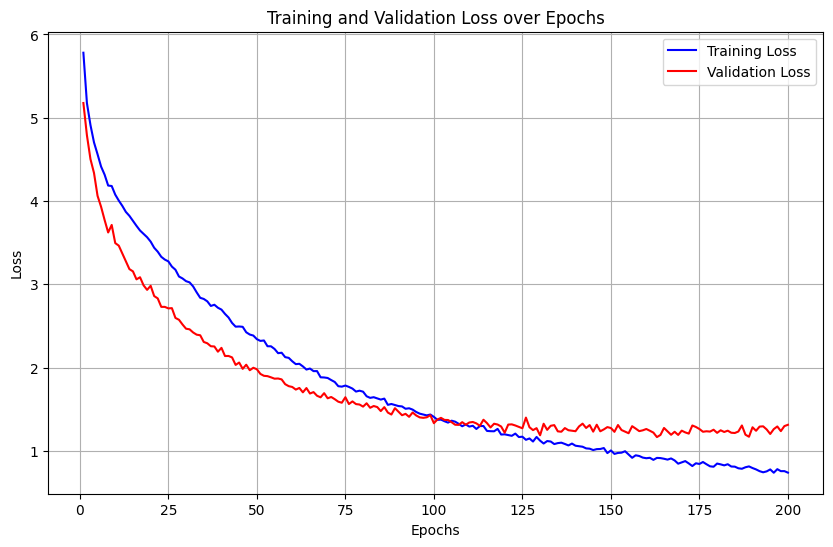

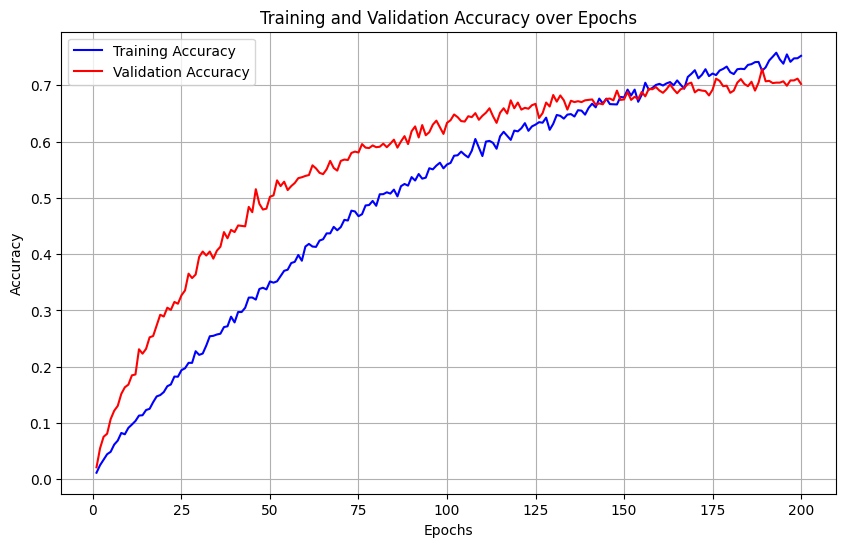

In [33]:
plot_metrics(train_losses, val_losses, 'Loss')
plot_metrics(train_accuracies, val_accuracies, 'Accuracy')